In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [2]:
df = pd.read_csv('Churn.csv')
df.head()

,Unnamed: 0,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,...,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
0,1,KS,area_code_415,128,yes,25,no,10.0,3,2.70,...,110,45.07,197.4,99,16.78,244.7,91,11.01,1,no
1,2,OH,area_code_415,107,yes,26,no,13.7,3,3.70,...,123,27.47,195.5,103,16.62,254.4,103,11.45,1,no
2,3,NJ,area_code_415,137,no,0,no,12.2,5,3.29,...,114,41.38,121.2,110,10.30,162.6,104,7.32,0,no
3,4,OH,area_code_408,84,no,0,yes,6.6,7,1.78,...,71,50.9,61.9,88,5.26,196.9,89,8.86,2,no
4,5,OK,area_code_415,75,no,0,yes,10.1,3,2.73,...,113,28.34,148.3,122,12.61,186.9,121,8.41,3,no


In [3]:
df.tail()

,Unnamed: 0,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,...,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
4995,4996,HI,area_code_408,50,yes,40,no,9.9,5,2.67,...,127,40.07,223,126,18.96,297.5,116,13.39,2,no
4996,4997,WV,area_code_415,152,no,0,no,14.7,2,3.97,...,90,31.31,256.8,73,21.83,213.6,113,9.61,3,yes
4997,4998,DC,area_code_415,61,no,0,no,13.6,4,3.67,...,89,23.9,172.8,128,14.69,212.4,97,9.56,1,no
4998,4999,DC,area_code_510,109,no,0,no,8.5,6,2.30,...,67,32.1,171.7,92,14.59,224.4,89,10.10,0,no
4999,5000,VT,area_code_415,86,yes,34,no,9.3,16,2.51,...,102,22,267.1,104,22.70,154.8,100,6.97,0,no


In [4]:
df.shape

(5000, 21)

In [5]:
df.columns

Index(['Unnamed: 0', 'state', 'area.code', 'account.length', 'voice.plan',
       'voice.messages', 'intl.plan', 'intl.mins', 'intl.calls', 'intl.charge',
       'day.mins', 'day.calls', 'day.charge', 'eve.mins', 'eve.calls',
       'eve.charge', 'night.mins', 'night.calls', 'night.charge',
       'customer.calls', 'churn'],
      dtype='object')

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unnamed: 0      5000 non-null   int64  
 1   state           5000 non-null   object 
 2   area.code       5000 non-null   object 
 3   account.length  5000 non-null   int64  
 4   voice.plan      5000 non-null   object 
 5   voice.messages  5000 non-null   int64  
 6   intl.plan       5000 non-null   object 
 7   intl.mins       5000 non-null   float64
 8   intl.calls      5000 non-null   int64  
 9   intl.charge     5000 non-null   float64
 10  day.mins        5000 non-null   float64
 11  day.calls       5000 non-null   int64  
 12  day.charge      5000 non-null   object 
 13  eve.mins        5000 non-null   object 
 14  eve.calls       5000 non-null   int64  
 15  eve.charge      5000 non-null   float64
 16  night.mins      5000 non-null   float64
 17  night.calls     5000 non-null   i

In [7]:
df.isnull().sum()

Unnamed: 0        0
state             0
area.code         0
account.length    0
voice.plan        0
voice.messages    0
intl.plan         0
intl.mins         0
intl.calls        0
intl.charge       0
day.mins          0
day.calls         0
day.charge        0
eve.mins          0
eve.calls         0
eve.charge        0
night.mins        0
night.calls       0
night.charge      0
customer.calls    0
churn             0
dtype: int64

<AxesSubplot:>

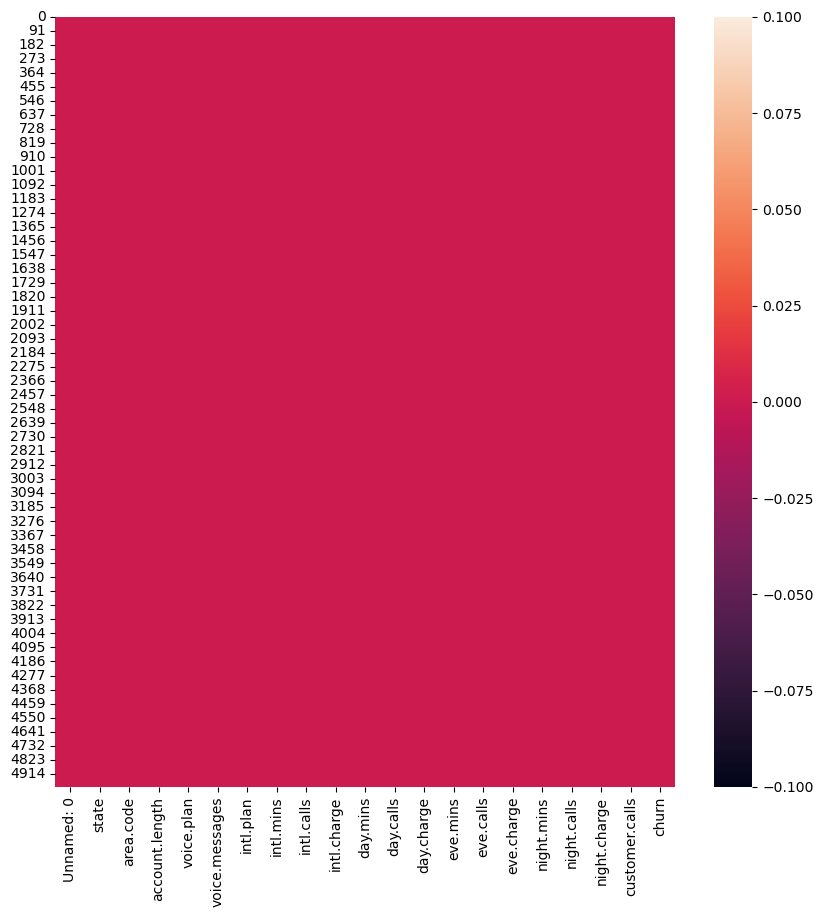

In [8]:
plt.figure(figsize=(10,10))
sns.heatmap(df.isnull())

In [9]:
for i in df.columns:
  if df[i].dtypes == 'object':
    print(df[i][df[i]=='Nan'])

Series([], Name: state, dtype: object)
Series([], Name: area.code, dtype: object)
Series([], Name: voice.plan, dtype: object)
Series([], Name: intl.plan, dtype: object)
12      Nan
27      Nan
47      Nan
4407    Nan
4755    Nan
4965    Nan
4992    Nan
Name: day.charge, dtype: object
89      Nan
102     Nan
110     Nan
159     Nan
231     Nan
254     Nan
299     Nan
345     Nan
460     Nan
557     Nan
624     Nan
684     Nan
729     Nan
750     Nan
795     Nan
892     Nan
1012    Nan
1099    Nan
1219    Nan
1417    Nan
1483    Nan
1625    Nan
1699    Nan
1778    Nan
Name: eve.mins, dtype: object
Series([], Name: churn, dtype: object)


In [10]:
df2 = df.iloc[:,10:16]
df2.head(5)

,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge
0,265.1,110,45.07,197.4,99,16.78
1,161.6,123,27.47,195.5,103,16.62
2,243.4,114,41.38,121.2,110,10.30
3,299.4,71,50.9,61.9,88,5.26
4,166.7,113,28.34,148.3,122,12.61


In [11]:
df2[df2['day.charge']=='Nan']

,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge
12,128.8,96,Nan,104.9,71,8.92
27,134.3,73,Nan,155.5,100,13.22
47,187.0,133,Nan,134.6,74,11.44
4407,138.5,96,Nan,159.7,117,13.57
4755,180.4,121,Nan,228.5,111,19.42
4965,192.1,87,Nan,193,122,16.41
4992,188.3,70,Nan,243.8,88,20.72


In [12]:
print(df2[df2['day.mins']==128.8]) 
print(df2[df2['day.mins']==134.3])
print(df2[df2['day.mins']==187.0])
print(df2[df2['day.mins']==138.5])
print(df2[df2['day.mins']==180.4])
print(df2[df2['day.mins']==192.1])
print(df2[df2['day.mins']==188.3])

      day.mins  day.calls day.charge eve.mins  eve.calls  eve.charge
12       128.8         96        Nan    104.9         71        8.92
1446     128.8        104       21.9    157.3         52       13.37
1725     128.8         86       21.9    203.9        105       17.33
2538     128.8         80       21.9    208.7         93       17.74
      day.mins  day.calls day.charge eve.mins  eve.calls  eve.charge
27       134.3         73        Nan    155.5        100       13.22
1221     134.3         98      22.83    202.3        109       17.20
4542     134.3         99      22.83    203.9        103       17.33
      day.mins  day.calls day.charge eve.mins  eve.calls  eve.charge
47       187.0        133        Nan    134.6         74       11.44
1631     187.0         65      31.79    141.4        128       12.02
4876     187.0         95      31.79    163.6        136       13.91
      day.mins  day.calls day.charge eve.mins  eve.calls  eve.charge
2085     138.5        110      23.

In [13]:
print(df2[df2['eve.mins']=='Nan'])

      day.mins  day.calls day.charge eve.mins  eve.calls  eve.charge
89       237.9        125      40.44      Nan         93       21.05
102      151.7         82      25.79      Nan        105       10.12
110      165.0        100      28.05      Nan         83       26.96
159      142.1        124      24.16      Nan        129       15.59
231      199.0        110      33.83      Nan        111       24.76
254      143.7        117      24.43      Nan         82       23.21
299      181.5         98      30.86      Nan         88       16.99
345      260.2        131      44.23      Nan        120       15.23
460      261.8        128      44.51      Nan        104       18.75
557      194.5        110      33.07      Nan         89       18.16
624      161.4        110      27.44      Nan        125       18.75
684      100.1         90      17.02      Nan         93       19.83
729      196.5         98      33.41      Nan        111       14.94
750      154.0         80      26.

In [14]:
print(df2[df2['eve.charge']==21.05]) 
print(df2[df2['eve.charge']==10.12])
print(df2[df2['eve.charge']==26.96])
print(df2[df2['eve.charge']==15.59])
print(df2[df2['eve.charge']==24.76])
print(df2[df2['eve.charge']==23.21])
print(df2[df2['eve.charge']==16.99])
print(df2[df2['eve.charge']==15.23]) 
print(df2[df2['eve.charge']==18.75])

      day.mins  day.calls day.charge eve.mins  eve.calls  eve.charge
13       156.6         88      26.62    247.6         75       21.05
89       237.9        125      40.44      Nan         93       21.05
211      203.5        100       34.6    247.6        103       21.05
296       85.7         83      14.57    247.7         67       21.05
1655     127.1        102      21.61    247.7        106       21.05
2430     128.1         99      21.78    247.7         78       21.05
4359     157.2         81      26.72    247.7        131       21.05
     day.mins  day.calls day.charge eve.mins  eve.calls  eve.charge
102     151.7         82      25.79      Nan        105       10.12
746     150.6         85       25.6      119        128       10.12
     day.mins  day.calls day.charge eve.mins  eve.calls  eve.charge
110     165.0        100      28.05      Nan         83       26.96
      day.mins  day.calls day.charge eve.mins  eve.calls  eve.charge
159      142.1        124      24.16   

In [15]:
import numpy as np
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.linear_model import LinearRegression

linearreg = LinearRegression()
imp = IterativeImputer(estimator=linearreg,missing_values=np.nan, max_iter=5, verbose=2, imputation_order='roman',random_state=0)
ImputedData=imp.fit_transform(df2)

[IterativeImputer] Completing matrix with shape (5000, 6)
[IterativeImputer] Ending imputation round 1/5, elapsed time 0.44
[IterativeImputer] Change: 116.59450867132455, scaled tolerance: 0.3637 
[IterativeImputer] Ending imputation round 2/5, elapsed time 0.44
[IterativeImputer] Change: 4.440518486958922e-05, scaled tolerance: 0.3637 
[IterativeImputer] Early stopping criterion reached.


In [16]:
df3 = pd.DataFrame(ImputedData,columns=df2.columns)
df3.head()

,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge
0,265.1,110.0,45.07,197.4,99.0,16.78
1,161.6,123.0,27.47,195.5,103.0,16.62
2,243.4,114.0,41.38,121.2,110.0,10.30
3,299.4,71.0,50.90,61.9,88.0,5.26
4,166.7,113.0,28.34,148.3,122.0,12.61


In [17]:
print(df2[df2['eve.charge']==21.05]) 
print(df2[df2['eve.charge']==10.12])
print(df2[df2['eve.charge']==26.96])
print(df2[df2['eve.charge']==15.59])

      day.mins  day.calls day.charge eve.mins  eve.calls  eve.charge
13       156.6         88      26.62    247.6         75       21.05
89       237.9        125      40.44      Nan         93       21.05
211      203.5        100       34.6    247.6        103       21.05
296       85.7         83      14.57    247.7         67       21.05
1655     127.1        102      21.61    247.7        106       21.05
2430     128.1         99      21.78    247.7         78       21.05
4359     157.2         81      26.72    247.7        131       21.05
     day.mins  day.calls day.charge eve.mins  eve.calls  eve.charge
102     151.7         82      25.79      Nan        105       10.12
746     150.6         85       25.6      119        128       10.12
     day.mins  day.calls day.charge eve.mins  eve.calls  eve.charge
110     165.0        100      28.05      Nan         83       26.96
      day.mins  day.calls day.charge eve.mins  eve.calls  eve.charge
159      142.1        124      24.16   

In [18]:
print(df3[df3['eve.charge']==21.05]) 
print(df3[df3['eve.charge']==10.12])
print(df3[df3['eve.charge']==26.96])
print(df3[df3['eve.charge']==15.59])

      day.mins  day.calls  day.charge    eve.mins  eve.calls  eve.charge
13       156.6       88.0       26.62  247.600000       75.0       21.05
89       237.9      125.0       40.44  247.644844       93.0       21.05
211      203.5      100.0       34.60  247.600000      103.0       21.05
296       85.7       83.0       14.57  247.700000       67.0       21.05
1655     127.1      102.0       21.61  247.700000      106.0       21.05
2430     128.1       99.0       21.78  247.700000       78.0       21.05
4359     157.2       81.0       26.72  247.700000      131.0       21.05
     day.mins  day.calls  day.charge    eve.mins  eve.calls  eve.charge
102     151.7       82.0       25.79  119.055716      105.0       10.12
746     150.6       85.0       25.60  119.000000      128.0       10.12
     day.mins  day.calls  day.charge    eve.mins  eve.calls  eve.charge
110     165.0      100.0       28.05  317.174834       83.0       26.96
      day.mins  day.calls  day.charge    eve.mins  eve.c

In [19]:
df3.head()

,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge
0,265.1,110.0,45.07,197.4,99.0,16.78
1,161.6,123.0,27.47,195.5,103.0,16.62
2,243.4,114.0,41.38,121.2,110.0,10.30
3,299.4,71.0,50.90,61.9,88.0,5.26
4,166.7,113.0,28.34,148.3,122.0,12.61


In [20]:
df.drop(['day.mins','day.calls','day.charge','eve.mins','eve.calls','eve.charge'],axis=1, inplace=True)

In [21]:
df.head()

,Unnamed: 0,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,night.mins,night.calls,night.charge,customer.calls,churn
0,1,KS,area_code_415,128,yes,25,no,10.0,3,2.70,244.7,91,11.01,1,no
1,2,OH,area_code_415,107,yes,26,no,13.7,3,3.70,254.4,103,11.45,1,no
2,3,NJ,area_code_415,137,no,0,no,12.2,5,3.29,162.6,104,7.32,0,no
3,4,OH,area_code_408,84,no,0,yes,6.6,7,1.78,196.9,89,8.86,2,no
4,5,OK,area_code_415,75,no,0,yes,10.1,3,2.73,186.9,121,8.41,3,no


In [22]:
data = pd.concat([df,df3],axis=1, join='inner')

In [23]:
data.head()

,Unnamed: 0,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,...,night.calls,night.charge,customer.calls,churn,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge
0,1,KS,area_code_415,128,yes,25,no,10.0,3,2.70,...,91,11.01,1,no,265.1,110.0,45.07,197.4,99.0,16.78
1,2,OH,area_code_415,107,yes,26,no,13.7,3,3.70,...,103,11.45,1,no,161.6,123.0,27.47,195.5,103.0,16.62
2,3,NJ,area_code_415,137,no,0,no,12.2,5,3.29,...,104,7.32,0,no,243.4,114.0,41.38,121.2,110.0,10.30
3,4,OH,area_code_408,84,no,0,yes,6.6,7,1.78,...,89,8.86,2,no,299.4,71.0,50.90,61.9,88.0,5.26
4,5,OK,area_code_415,75,no,0,yes,10.1,3,2.73,...,121,8.41,3,no,166.7,113.0,28.34,148.3,122.0,12.61


In [24]:
data.isnull().sum()

Unnamed: 0        0
state             0
area.code         0
account.length    0
voice.plan        0
voice.messages    0
intl.plan         0
intl.mins         0
intl.calls        0
intl.charge       0
night.mins        0
night.calls       0
night.charge      0
customer.calls    0
churn             0
day.mins          0
day.calls         0
day.charge        0
eve.mins          0
eve.calls         0
eve.charge        0
dtype: int64

In [25]:
data.duplicated().sum()

0

In [26]:
data.describe()

,Unnamed: 0,account.length,voice.messages,intl.mins,intl.calls,intl.charge,night.mins,night.calls,night.charge,customer.calls,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge
count,5000.000000,5000.00000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,2500.500000,100.25860,7.755200,10.261780,4.435200,2.771196,200.391620,99.919200,9.017732,1.570400,180.288900,100.029400,30.649666,200.636515,100.191000,17.054322
std,1443.520003,39.69456,13.546393,2.761396,2.456788,0.745514,50.527789,19.958686,2.273763,1.306363,53.894699,19.831197,9.162070,50.551303,19.826496,4.296843
min,1.000000,1.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1250.750000,73.00000,0.000000,8.500000,3.000000,2.300000,166.900000,87.000000,7.510000,1.000000,143.700000,87.000000,24.430000,166.375000,87.000000,14.140000
50%,2500.500000,100.00000,0.000000,10.300000,4.000000,2.780000,200.400000,100.000000,9.020000,1.000000,180.100000,100.000000,30.620000,201.000000,100.000000,17.090000
75%,3750.250000,127.00000,17.000000,12.000000,6.000000,3.240000,234.700000,113.000000,10.560000,2.000000,216.200000,113.000000,36.750000,234.100000,114.000000,19.900000
max,5000.000000,243.00000,52.000000,20.000000,20.000000,5.400000,395.000000,175.000000,17.770000,9.000000,351.500000,165.000000,59.760000,363.700000,170.000000,30.910000


In [27]:
data.describe(include=['O'])

,state,area.code,voice.plan,intl.plan,churn
count,5000,5000,5000,5000,5000
unique,51,3,2,2,2
top,WV,area_code_415,no,no,no
freq,158,2495,3677,4527,4293


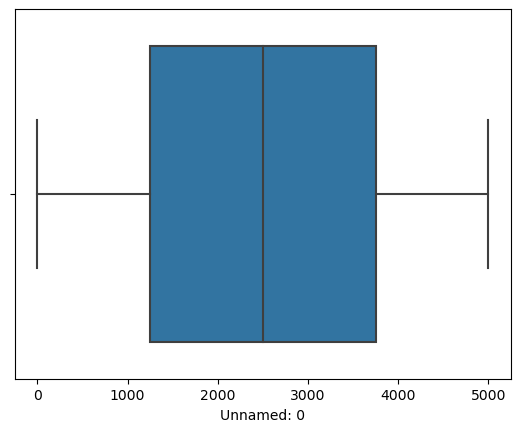

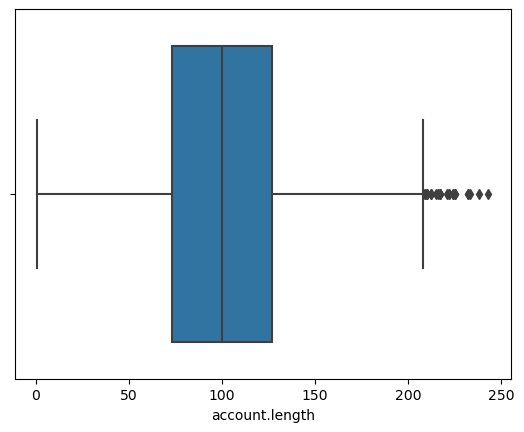

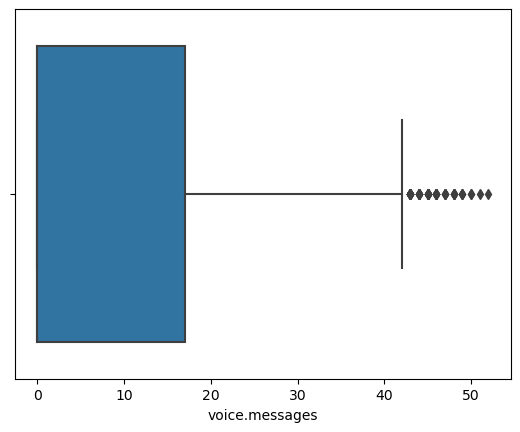

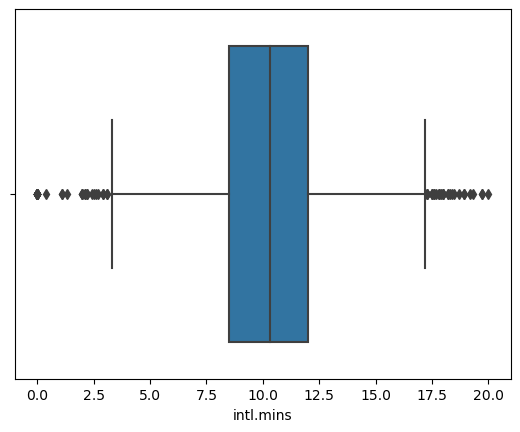

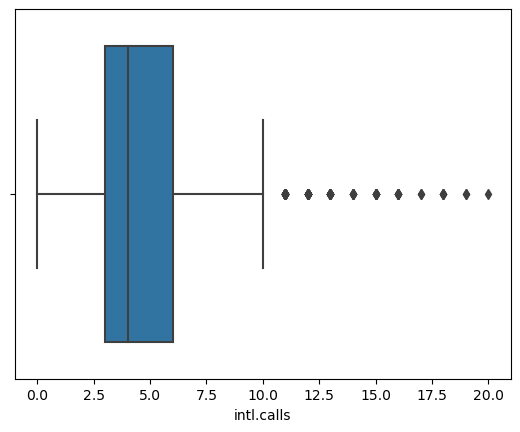

...

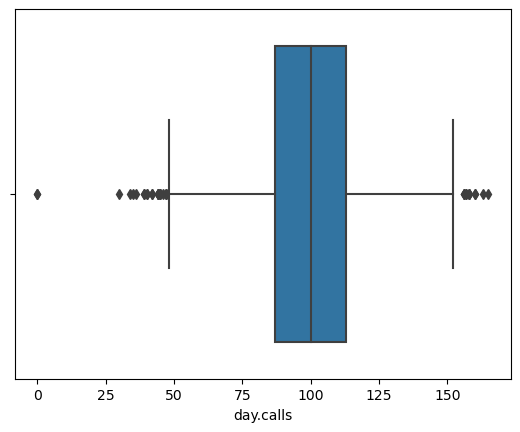

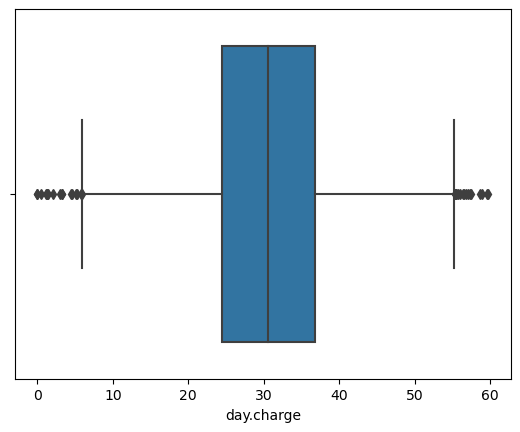

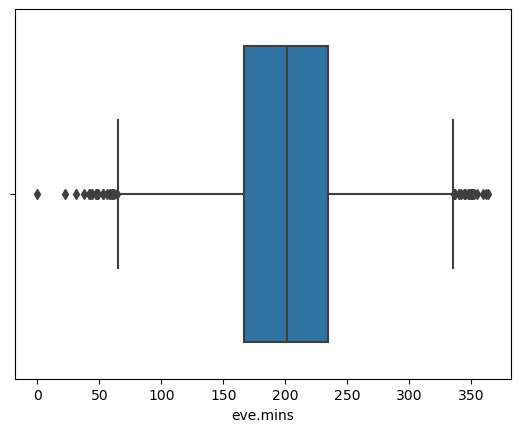

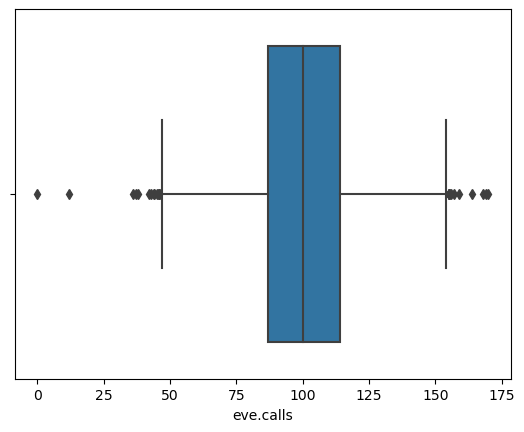

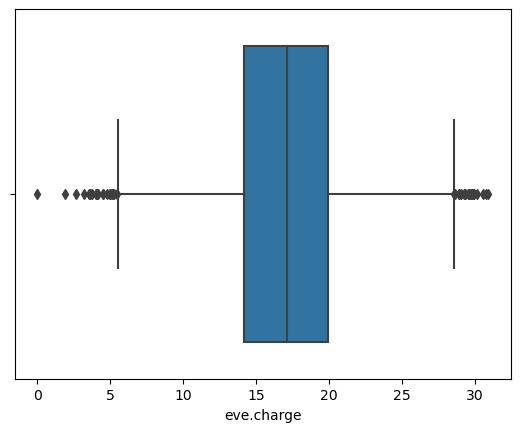

In [28]:
for i in data.columns:
  if data[i].dtype!='object':
    sns.boxplot(data[i])
    plt.show()

In [29]:
for i in data.columns:
  if data[i].dtype!='object':
    Q1 = data[i].quantile(0.25)
    Q3 = data[i].quantile(0.75)
    IQR = Q3 - Q1
    Outer_layer = Q3+1.5*IQR
    Lower_layer = Q1-1.5*IQR
    Outer_layer,Lower_layer

    data.loc[data[i] <Lower_layer, i] = Lower_layer
    data.loc[data[i] >Outer_layer, i] = Outer_layer

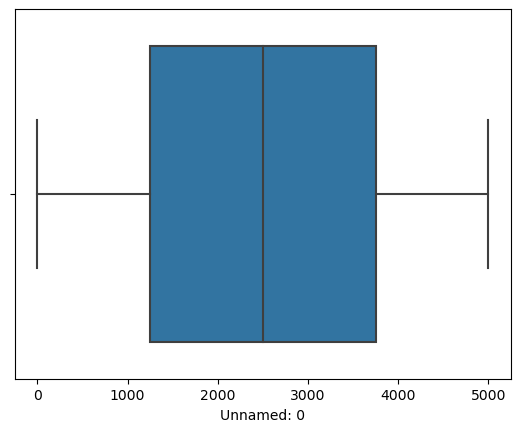

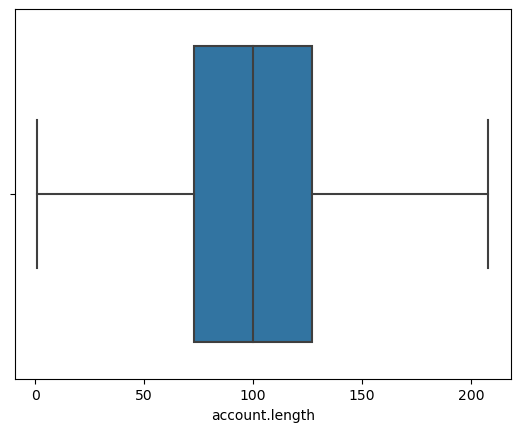

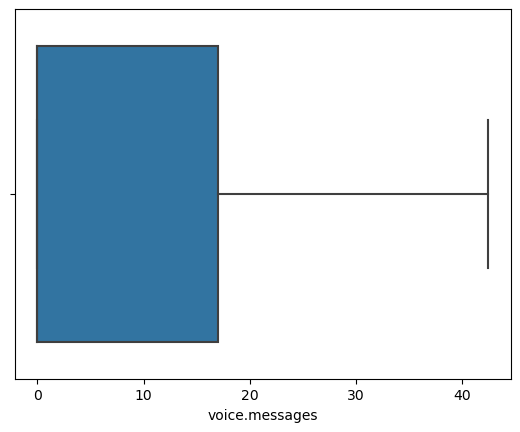

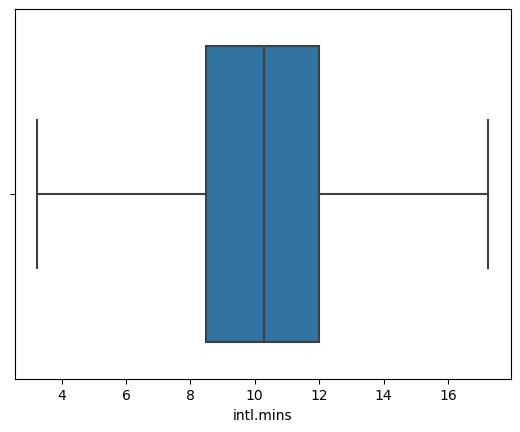

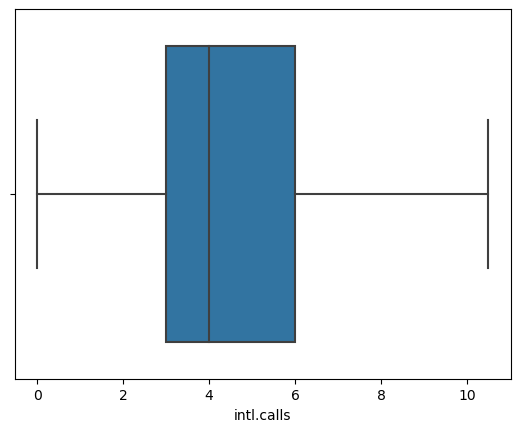

...

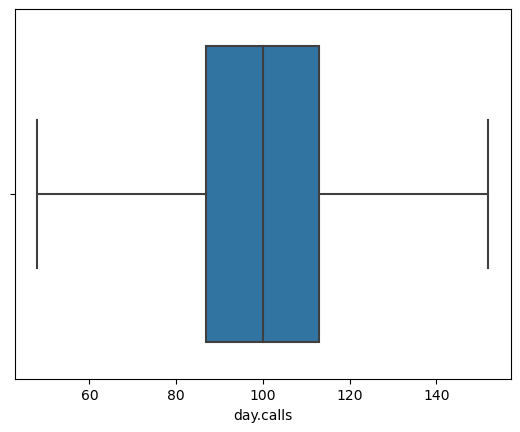

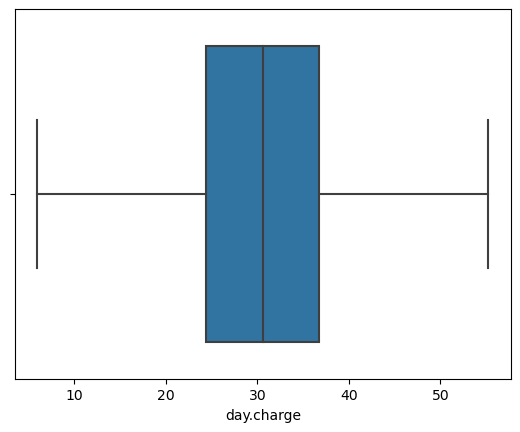

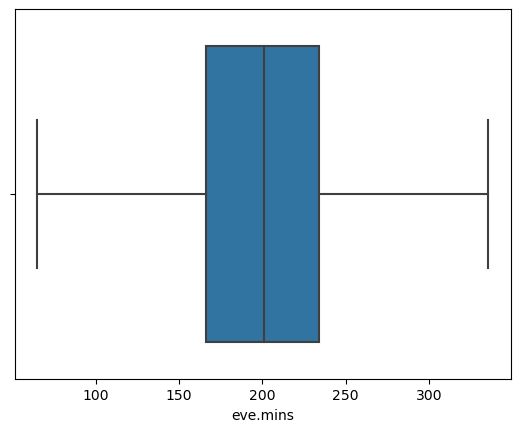

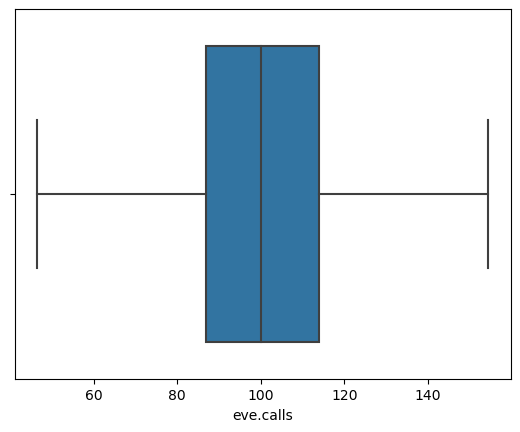

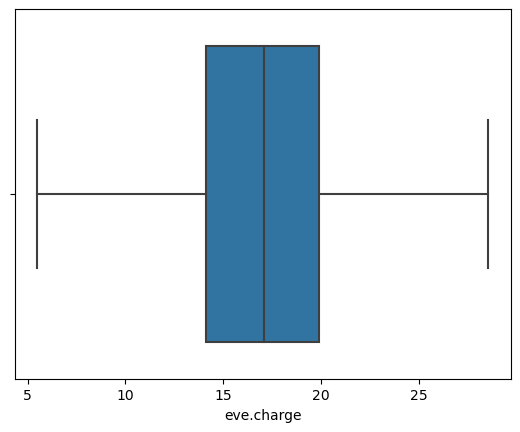

In [30]:
for i in data.columns:
  if data[i].dtype!='object':
    sns.boxplot(data[i])
    plt.show()

In [31]:
data['churn'].value_counts()

no     4293
yes     707
Name: churn, dtype: int64

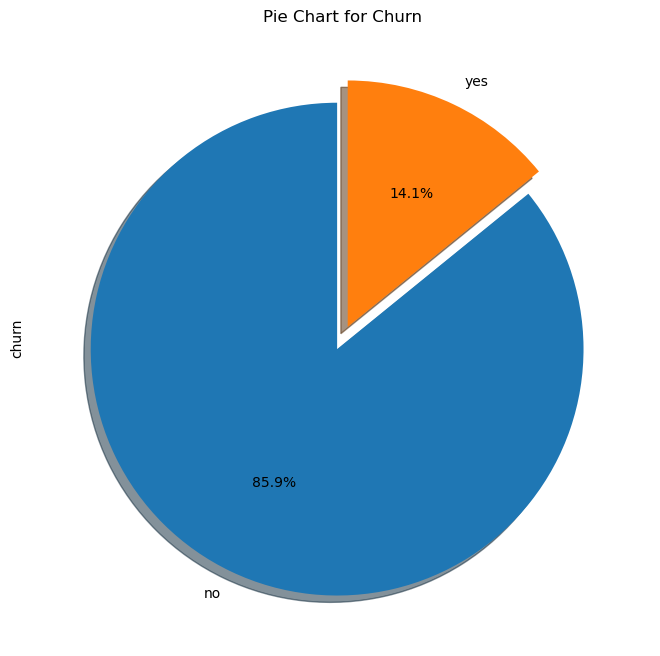

In [32]:
data ['churn'].value_counts().plot.pie(explode=[0.05,0.05], autopct='%1.1f%%',  startangle=90,shadow=True, figsize=(8,8))
plt.title('Pie Chart for Churn')
plt.show()

<AxesSubplot:xlabel='churn', ylabel='count'>

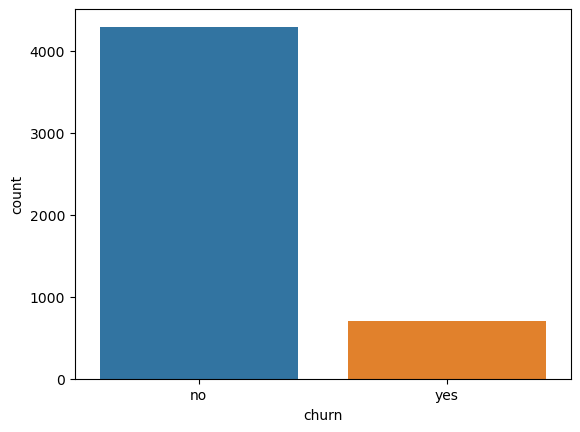

In [33]:
sns.countplot(x=data.churn)

In [34]:
data['state'].nunique()

51

<AxesSubplot:xlabel='state', ylabel='count'>

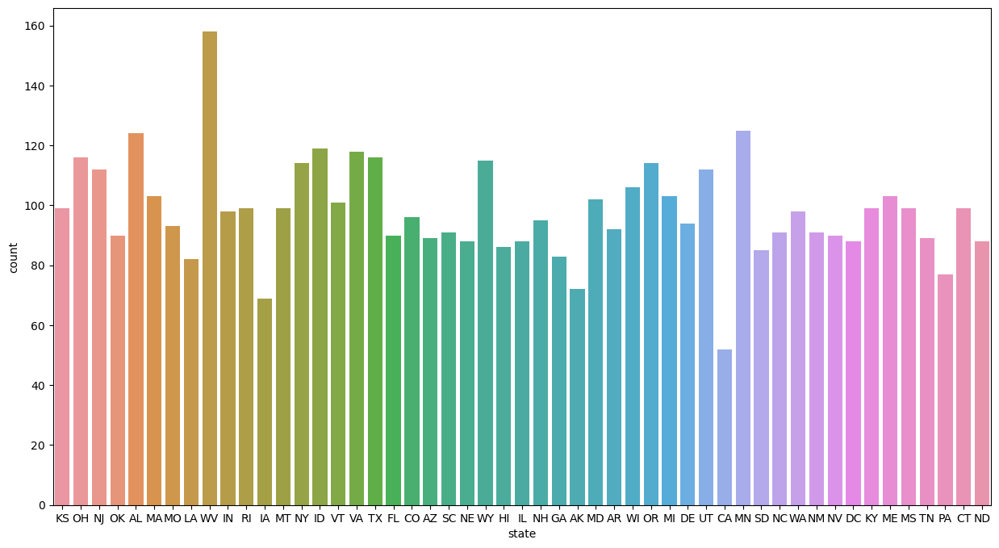

In [35]:
plt.figure(figsize=(15,8))
sns.countplot(x=data.state)

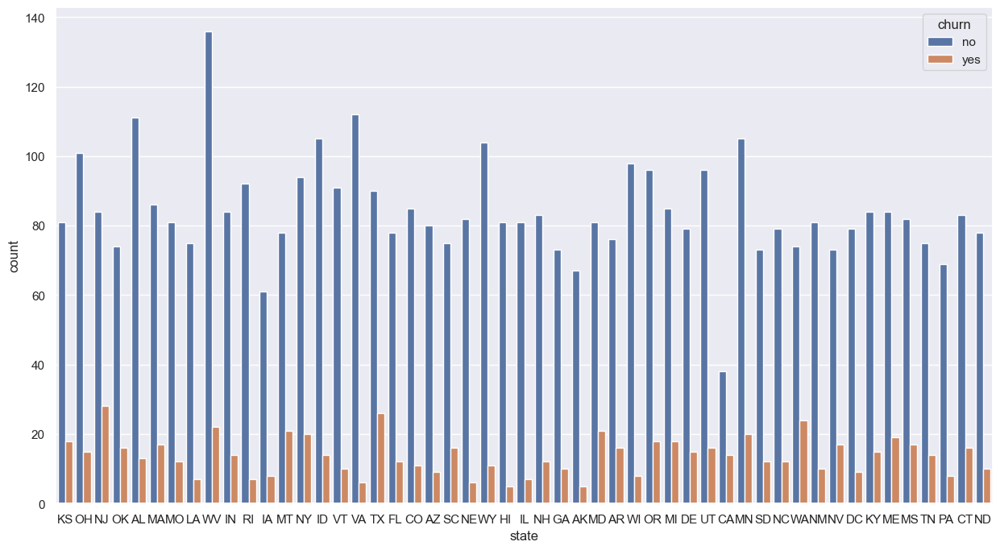

In [36]:
sns.set(style="darkgrid")
plt.figure(figsize=(15,8))
ax = sns.countplot(x='state', hue="churn", data=data)
plt.show()

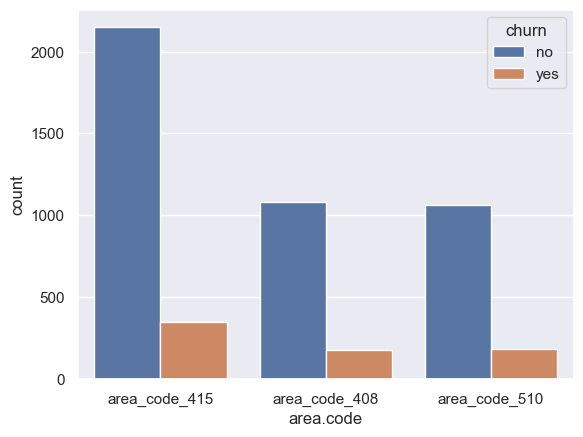

In [37]:
sns.set(style="darkgrid")
ax = sns.countplot(x='area.code', hue="churn", data=data)
plt.show()

<AxesSubplot:xlabel='account.length', ylabel='Density'>

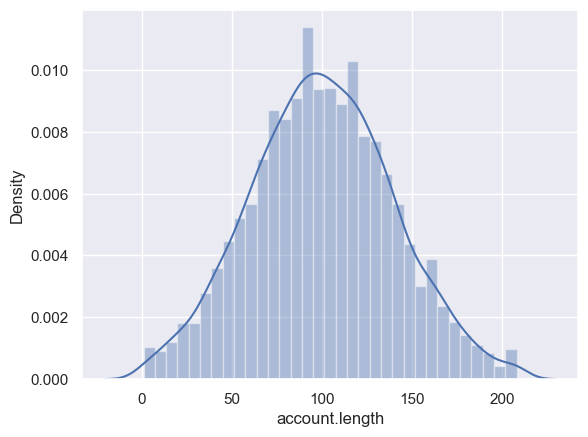

In [38]:
sns.distplot(data['account.length'])

In [39]:
data['intl.plan'].value_counts()

no     4527
yes     473
Name: intl.plan, dtype: int64

In [40]:
International_plan_data = pd.crosstab(data["intl.plan"],data["churn"])
International_plan_data['Percentage Churn'] = International_plan_data.apply(lambda x : x[1]*100/(x[0]+x[1]),axis = 1)
print(International_plan_data)

churn        no  yes  Percentage Churn
intl.plan                             
no         4019  508         11.221560
yes         274  199         42.071882


<AxesSubplot:xlabel='intl.plan', ylabel='count'>

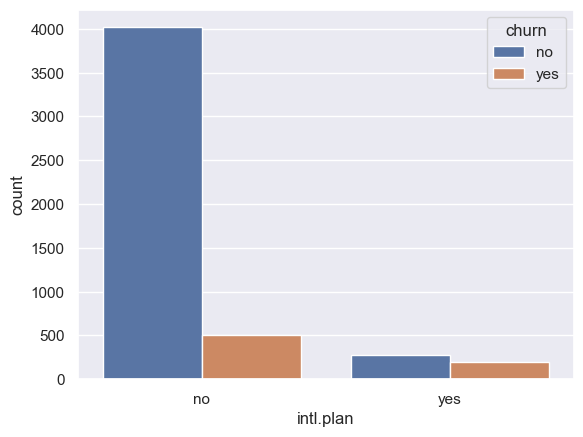

In [41]:
sns.countplot(x='intl.plan',hue="churn",data = data)

In [42]:
data["voice.plan"].value_counts()

no     3677
yes    1323
Name: voice.plan, dtype: int64

In [43]:
Voice_mail_plan_data = pd.crosstab(data["voice.plan"],data["churn"])
Voice_mail_plan_data['Percentage Churn'] = Voice_mail_plan_data.apply(lambda x : x[1]*100/(x[0]+x[1]),axis = 1)
print(Voice_mail_plan_data)

churn         no  yes  Percentage Churn
voice.plan                             
no          3072  605         16.453631
yes         1221  102          7.709751


<AxesSubplot:xlabel='voice.plan', ylabel='count'>

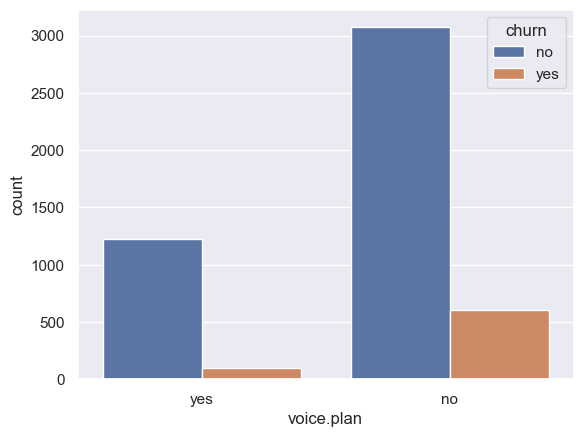

In [44]:
sns.countplot(x='voice.plan',hue="churn",data = data)

In [45]:
data['voice.messages'].value_counts()

0.0     3678
31.0      83
29.0      67
28.0      67
33.0      66
24.0      64
27.0      64
42.5      60
30.0      58
26.0      58
32.0      57
23.0      52
25.0      51
22.0      47
36.0      45
37.0      43
39.0      42
35.0      41
34.0      41
38.0      41
21.0      41
20.0      32
40.0      28
19.0      27
41.0      22
17.0      21
42.0      19
18.0      18
16.0      17
15.0      13
12.0      11
14.0       9
10.0       4
13.0       4
11.0       2
8.0        2
9.0        2
6.0        2
4.0        1
Name: voice.messages, dtype: int64

In [46]:
data['voice.messages'].describe()

count    5000.000000
mean        7.720200
std        13.450126
min         0.000000
25%         0.000000
50%         0.000000
75%        17.000000
max        42.500000
Name: voice.messages, dtype: float64

<AxesSubplot:xlabel='voice.messages', ylabel='Density'>

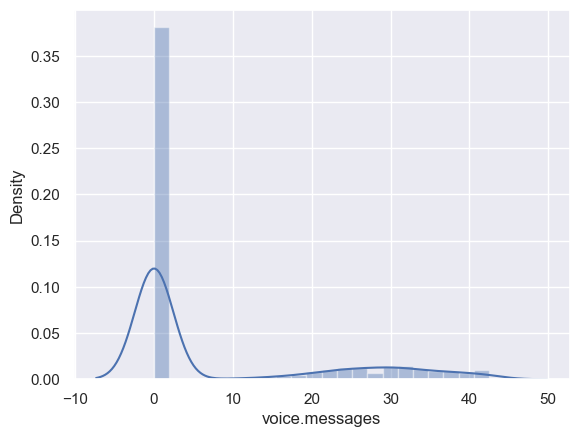

In [47]:
sns.distplot(data['voice.messages'])

<Figure size 1000x800 with 0 Axes>

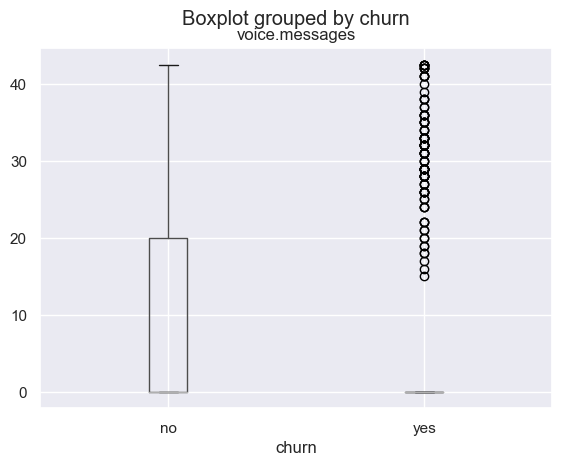

In [48]:
fig = plt.figure(figsize =(10, 8)) 
data.boxplot(column='voice.messages', by='churn')
fig.suptitle('voice.messages', fontsize=14, fontweight='bold')
plt.show()

In [49]:
data['customer.calls'].value_counts()

1.0    1786
2.0    1127
0.0    1023
3.0     665
3.5     399
Name: customer.calls, dtype: int64

In [50]:
Customer_service_calls_data = pd.crosstab(data['customer.calls'],data["churn"])
Customer_service_calls_data['Percentage_Churn'] = Customer_service_calls_data.apply(lambda x : x[1]*100/(x[0]+x[1]),axis = 1)
print(Customer_service_calls_data)

churn             no  yes  Percentage_Churn
customer.calls                             
0.0              902  121         11.827957
1.0             1596  190         10.638298
2.0             1005  122         10.825200
3.0              592   73         10.977444
3.5              198  201         50.375940


<AxesSubplot:xlabel='customer.calls', ylabel='count'>

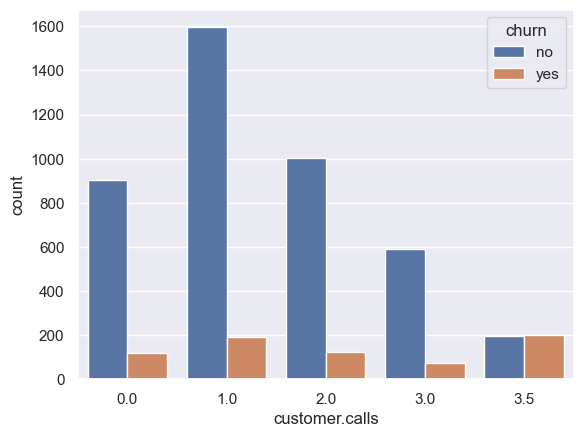

In [51]:
sns.countplot(x='customer.calls',hue="churn",data = data)

In [52]:
print(data.groupby(["churn"])['day.calls'].mean())

churn
no      99.926392
yes    100.865629
Name: day.calls, dtype: float64


In [53]:
print(data.groupby(["churn"])['day.mins'].mean())

churn
no     175.810948
yes    207.681612
Name: day.mins, dtype: float64


In [54]:
print(data.groupby(["churn"])['day.charge'].mean())

churn
no     29.888470
yes    35.305969
Name: day.charge, dtype: float64


<AxesSubplot:xlabel='day.mins', ylabel='day.charge'>

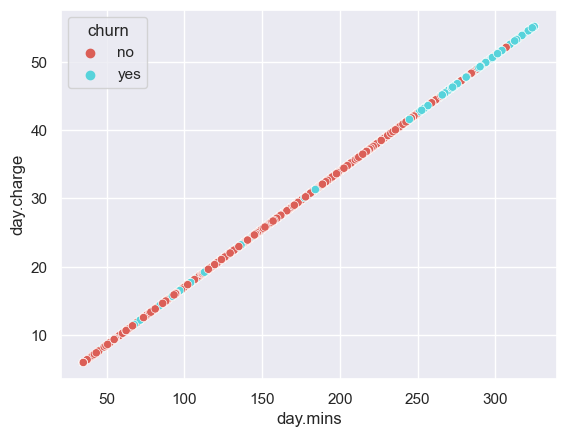

In [55]:
sns.scatterplot(x="day.mins", y="day.charge", hue="churn", data=data,palette='hls')

In [56]:
print(data.groupby(["churn"])['eve.calls'].mean())

churn
no     100.260307
yes     99.858557
Name: eve.calls, dtype: float64


In [57]:
print(data.groupby(["churn"])['eve.mins'].mean())

churn
no     198.857703
yes    211.627042
Name: eve.mins, dtype: float64


In [58]:
print(data.groupby(["churn"])['eve.charge'].mean())

churn
no     16.903117
yes    17.988515
Name: eve.charge, dtype: float64


<AxesSubplot:xlabel='eve.mins', ylabel='eve.charge'>

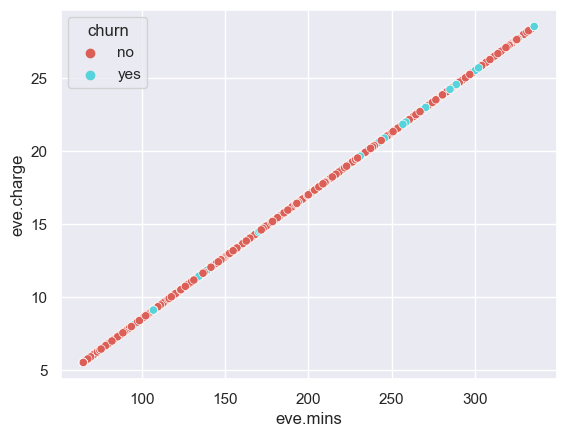

In [59]:
sns.scatterplot(x="eve.mins", y="eve.charge", hue="churn", data=data,palette='hls')

In [60]:
day_charge_perm = data['day.charge'].mean()/data['day.mins'].mean()
eve_charge_perm = data['eve.charge'].mean()/data['eve.mins'].mean()
night_charge_perm = data['night.charge'].mean()/data['night.mins'].mean()
int_charge_perm= data['intl.charge'].mean()/data['intl.mins'].mean()

In [61]:
print([day_charge_perm,eve_charge_perm,night_charge_perm,int_charge_perm])

[0.1700029734460646, 0.08500105919528969, 0.045000521549476286, 0.2700560144493127]


<AxesSubplot:>

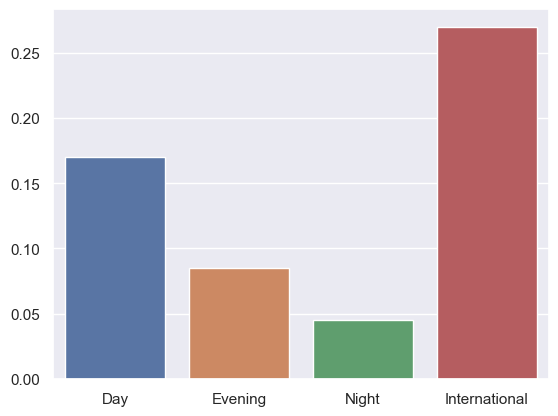

In [62]:
sns.barplot(x=['Day','Evening','Night','International'],y=[day_charge_perm,eve_charge_perm,night_charge_perm,int_charge_perm])

<AxesSubplot:>

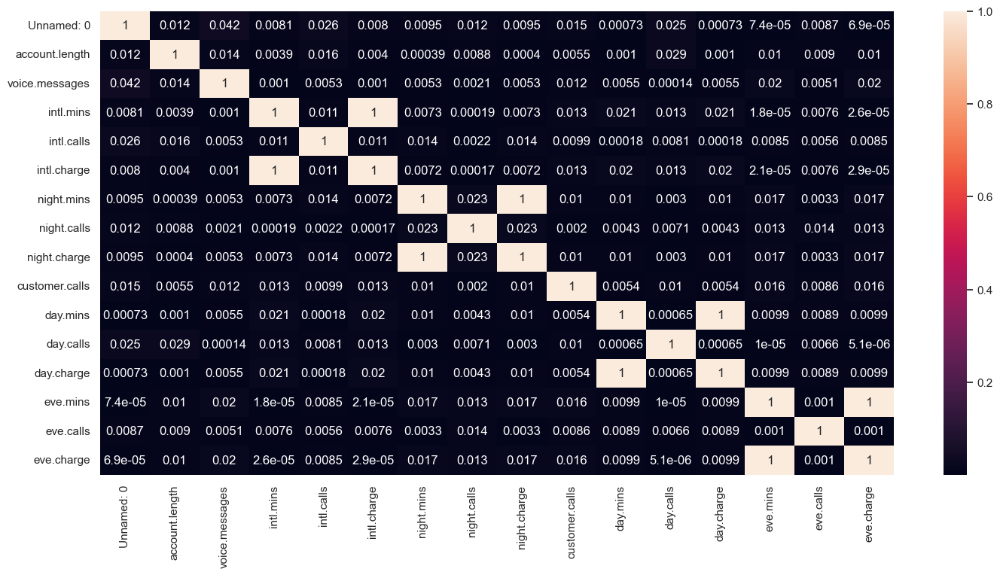

In [63]:
plt.figure(figsize=(17,8))
correlation=data.corr()
sns.heatmap(abs(correlation), annot=True)

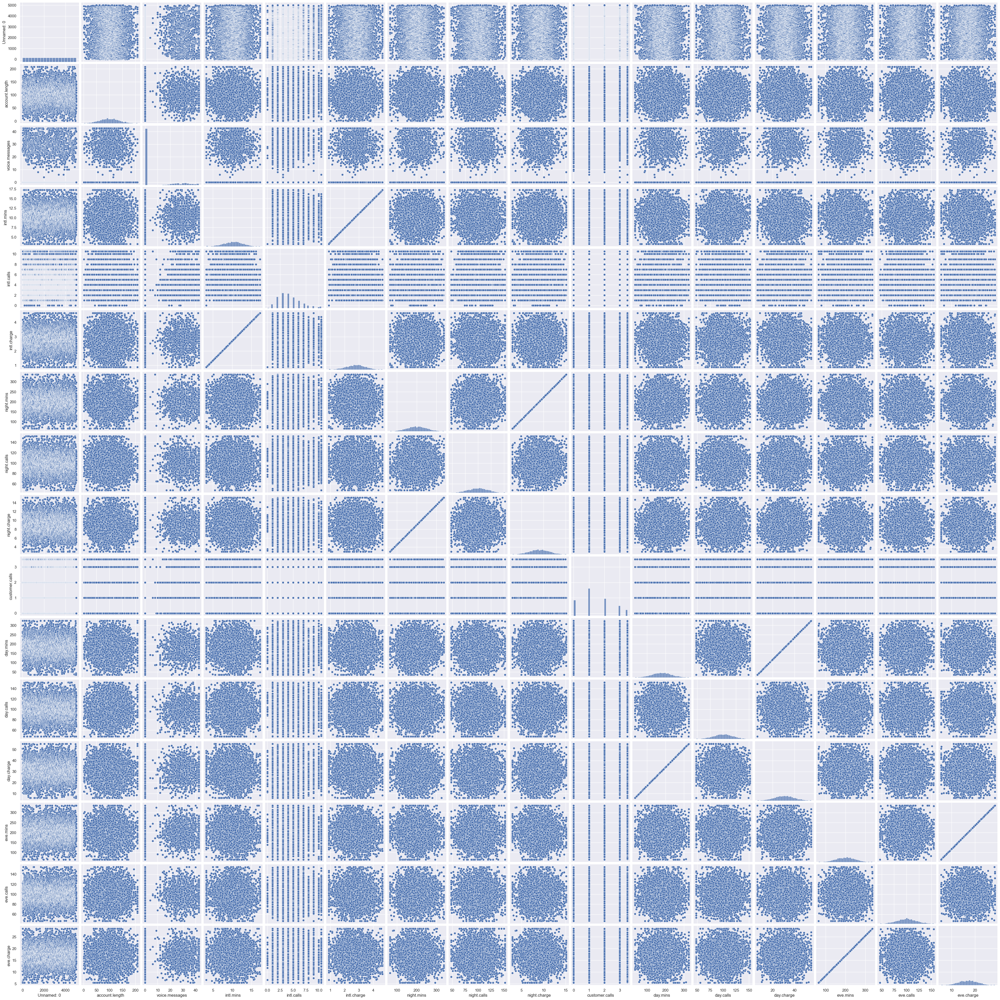

In [64]:
sns.pairplot(data)

In [65]:
data

,Unnamed: 0,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,...,night.calls,night.charge,customer.calls,churn,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge
0,1.0,KS,area_code_415,128,yes,25.0,no,10.0,3.0,2.70,...,91,11.01,1.0,no,265.1,110.0,45.07,197.4000,99.0,16.78
1,2.0,OH,area_code_415,107,yes,26.0,no,13.7,3.0,3.70,...,103,11.45,1.0,no,161.6,123.0,27.47,195.5000,103.0,16.62
2,3.0,NJ,area_code_415,137,no,0.0,no,12.2,5.0,3.29,...,104,7.32,0.0,no,243.4,114.0,41.38,121.2000,110.0,10.30
3,4.0,OH,area_code_408,84,no,0.0,yes,6.6,7.0,1.78,...,89,8.86,2.0,no,299.4,71.0,50.90,64.7875,88.0,5.50
4,5.0,OK,area_code_415,75,no,0.0,yes,10.1,3.0,2.73,...,121,8.41,3.0,no,166.7,113.0,28.34,148.3000,122.0,12.61
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,4996.0,HI,area_code_408,50,yes,40.0,no,9.9,5.0,2.67,...,116,13.39,2.0,no,235.7,127.0,40.07,223.0000,126.0,18.96
4996,4997.0,WV,area_code_415,152,no,0.0,no,14.7,2.0,3.97,...,113,9.61,3.0,yes,184.2,90.0,31.31,256.8000,73.0,21.83
4997,4998.0,DC,area_code_415,61,no,0.0,no,13.6,4.0,3.67,...,97,9.56,1.0,no,140.6,89.0,23.90,172.8000,128.0,14.69
4998,4999.0,DC,area_code_510,109,no,0.0,no,8.5,6.0,2.30,...,89,10.10,0.0,no,188.8,67.0,32.10,171.7000,92.0,14.59


In [66]:
data= pd.get_dummies(data, columns=["state", "area.code"], drop_first=True)
data

,Unnamed: 0,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,night.mins,night.calls,...,state_TX,state_UT,state_VA,state_VT,state_WA,state_WI,state_WV,state_WY,area.code_area_code_415,area.code_area_code_510
0,1.0,128,yes,25.0,no,10.0,3.0,2.70,244.7,91,...,0,0,0,0,0,0,0,0,1,0
1,2.0,107,yes,26.0,no,13.7,3.0,3.70,254.4,103,...,0,0,0,0,0,0,0,0,1,0
2,3.0,137,no,0.0,no,12.2,5.0,3.29,162.6,104,...,0,0,0,0,0,0,0,0,1,0
3,4.0,84,no,0.0,yes,6.6,7.0,1.78,196.9,89,...,0,0,0,0,0,0,0,0,0,0
4,5.0,75,no,0.0,yes,10.1,3.0,2.73,186.9,121,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,4996.0,50,yes,40.0,no,9.9,5.0,2.67,297.5,116,...,0,0,0,0,0,0,0,0,0,0
4996,4997.0,152,no,0.0,no,14.7,2.0,3.97,213.6,113,...,0,0,0,0,0,0,1,0,1,0
4997,4998.0,61,no,0.0,no,13.6,4.0,3.67,212.4,97,...,0,0,0,0,0,0,0,0,1,0
4998,4999.0,109,no,0.0,no,8.5,6.0,2.30,224.4,89,...,0,0,0,0,0,0,0,0,0,1


In [67]:
from sklearn import preprocessing
label_encoder = preprocessing.LabelEncoder()
data['voice.plan']= label_encoder.fit_transform(data['voice.plan'])
data['intl.plan']= label_encoder.fit_transform(data['intl.plan'])
data['churn']= label_encoder.fit_transform(data['churn'])
data

,Unnamed: 0,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,night.mins,night.calls,...,state_TX,state_UT,state_VA,state_VT,state_WA,state_WI,state_WV,state_WY,area.code_area_code_415,area.code_area_code_510
0,1.0,128,1,25.0,0,10.0,3.0,2.70,244.7,91,...,0,0,0,0,0,0,0,0,1,0
1,2.0,107,1,26.0,0,13.7,3.0,3.70,254.4,103,...,0,0,0,0,0,0,0,0,1,0
2,3.0,137,0,0.0,0,12.2,5.0,3.29,162.6,104,...,0,0,0,0,0,0,0,0,1,0
3,4.0,84,0,0.0,1,6.6,7.0,1.78,196.9,89,...,0,0,0,0,0,0,0,0,0,0
4,5.0,75,0,0.0,1,10.1,3.0,2.73,186.9,121,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,4996.0,50,1,40.0,0,9.9,5.0,2.67,297.5,116,...,0,0,0,0,0,0,0,0,0,0
4996,4997.0,152,0,0.0,0,14.7,2.0,3.97,213.6,113,...,0,0,0,0,0,0,1,0,1,0
4997,4998.0,61,0,0.0,0,13.6,4.0,3.67,212.4,97,...,0,0,0,0,0,0,0,0,1,0
4998,4999.0,109,0,0.0,0,8.5,6.0,2.30,224.4,89,...,0,0,0,0,0,0,0,0,0,1


In [68]:
data=data.drop(['Unnamed: 0'],axis=1)
data

,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,night.mins,night.calls,night.charge,...,state_TX,state_UT,state_VA,state_VT,state_WA,state_WI,state_WV,state_WY,area.code_area_code_415,area.code_area_code_510
0,128,1,25.0,0,10.0,3.0,2.70,244.7,91,11.01,...,0,0,0,0,0,0,0,0,1,0
1,107,1,26.0,0,13.7,3.0,3.70,254.4,103,11.45,...,0,0,0,0,0,0,0,0,1,0
2,137,0,0.0,0,12.2,5.0,3.29,162.6,104,7.32,...,0,0,0,0,0,0,0,0,1,0
3,84,0,0.0,1,6.6,7.0,1.78,196.9,89,8.86,...,0,0,0,0,0,0,0,0,0,0
4,75,0,0.0,1,10.1,3.0,2.73,186.9,121,8.41,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,50,1,40.0,0,9.9,5.0,2.67,297.5,116,13.39,...,0,0,0,0,0,0,0,0,0,0
4996,152,0,0.0,0,14.7,2.0,3.97,213.6,113,9.61,...,0,0,0,0,0,0,1,0,1,0
4997,61,0,0.0,0,13.6,4.0,3.67,212.4,97,9.56,...,0,0,0,0,0,0,0,0,1,0
4998,109,0,0.0,0,8.5,6.0,2.30,224.4,89,10.10,...,0,0,0,0,0,0,0,0,0,1


In [69]:
data.columns

Index(['account.length', 'voice.plan', 'voice.messages', 'intl.plan',
       'intl.mins', 'intl.calls', 'intl.charge', 'night.mins', 'night.calls',
       'night.charge', 'customer.calls', 'churn', 'day.mins', 'day.calls',
       'day.charge', 'eve.mins', 'eve.calls', 'eve.charge', 'state_AL',
       'state_AR', 'state_AZ', 'state_CA', 'state_CO', 'state_CT', 'state_DC',
       'state_DE', 'state_FL', 'state_GA', 'state_HI', 'state_IA', 'state_ID',
       'state_IL', 'state_IN', 'state_KS', 'state_KY', 'state_LA', 'state_MA',
       'state_MD', 'state_ME', 'state_MI', 'state_MN', 'state_MO', 'state_MS',
       'state_MT', 'state_NC', 'state_ND', 'state_NE', 'state_NH', 'state_NJ',
       'state_NM', 'state_NV', 'state_NY', 'state_OH', 'state_OK', 'state_OR',
       'state_PA', 'state_RI', 'state_SC', 'state_SD', 'state_TN', 'state_TX',
       'state_UT', 'state_VA', 'state_VT', 'state_WA', 'state_WI', 'state_WV',
       'state_WY', 'area.code_area_code_415', 'area.code_area_code_510'],

In [70]:
data.colums=['account_length', 'voice_plan', 'voice_messages', 'intl_plan',
       'intl_mins', 'intl_calls', 'intl_charge', 'night_mins', 'night_calls',
       'night_charge', 'customer_calls', 'day_mins', 'day_calls',
       'day_charge', 'eve_mins', 'eve_calls', 'eve_charge', 'state_AL',
       'state_AR', 'state_AZ', 'state_CA', 'state_CO', 'state_CT', 'state_DC',
       'state_DE', 'state_FL', 'state_GA', 'state_HI', 'state_IA', 'state_ID',
       'state_IL', 'state_IN', 'state_KS', 'state_KY', 'state_LA', 'state_MA',
       'state_MD', 'state_ME', 'state_MI', 'state_MN', 'state_MO', 'state_MS',
       'state_MT', 'state_NC', 'state_ND', 'state_NE', 'state_NH', 'state_NJ',
       'state_NM', 'state_NV', 'state_NY', 'state_OH', 'state_OK', 'state_OR',
       'state_PA', 'state_RI', 'state_SC', 'state_SD', 'state_TN', 'state_TX',
       'state_UT', 'state_VA', 'state_VT', 'state_WA', 'state_WI', 'state_WV',
       'state_WY', 'area.code_area_code_415', 'area.code_area_code_510', 'churn']

In [71]:
X =data.drop(['churn'],axis=1)
y =data['churn']

In [72]:
from sklearn.tree import DecisionTreeClassifier
clf_dt = DecisionTreeClassifier(random_state=42)
clf_dt.fit(X, y)

DecisionTreeClassifier(random_state=42)

In [73]:
importances = clf_dt.feature_importances_
feature_importances = pd.DataFrame({'feature': X.columns, 'importance': importances})
feature_importances.head(20)

,feature,importance
0,account.length,0.011061
1,voice.plan,0.000824
2,voice.messages,0.068931
3,intl.plan,0.067817
4,intl.mins,0.018169
5,intl.calls,0.079265
6,intl.charge,0.092583
7,night.mins,0.039824
8,night.calls,0.017208
9,night.charge,0.022718


<AxesSubplot:>

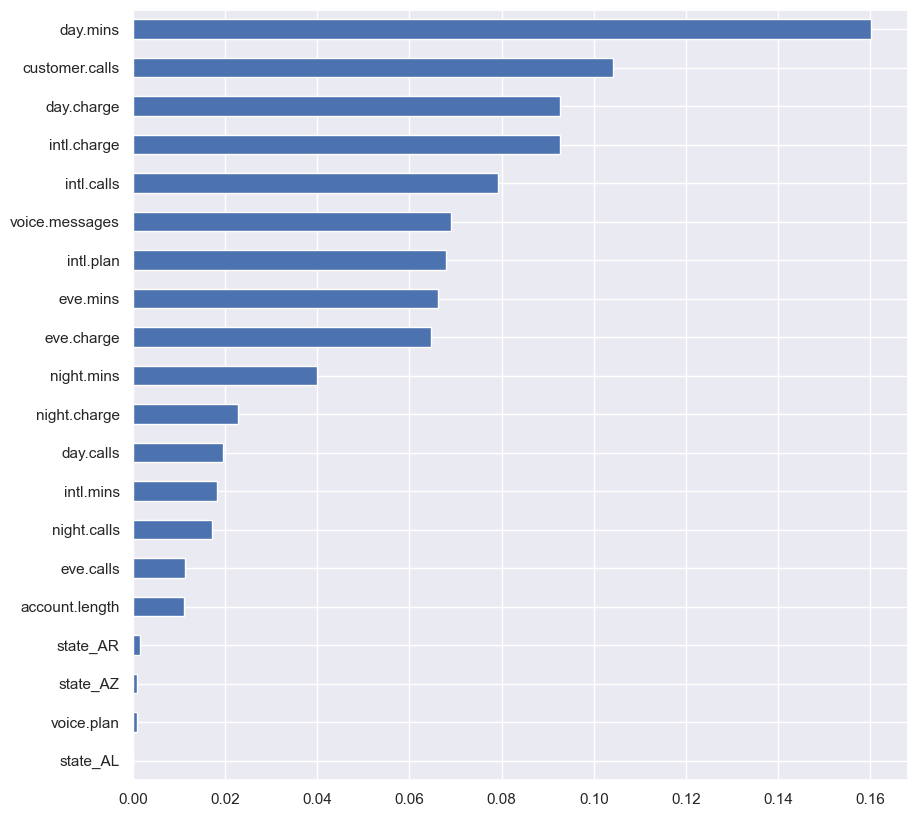

In [74]:
from matplotlib.pyplot import figure
plt.figure(figsize=(10, 10))
feat_importances = pd.Series(clf_dt.feature_importances_, index = X.columns).head(20).sort_values(ascending = True)
feat_importances.plot(kind = 'barh')

In [75]:
final_data=data[['account.length', 'voice.messages', 'intl.plan','intl.mins',
                 'intl.calls', 'night.mins', 'night.calls','customer.calls', 'day.mins',
                 'day.calls','eve.mins', 'eve.calls', 'churn']]
final_data.head()

,account.length,voice.messages,intl.plan,intl.mins,intl.calls,night.mins,night.calls,customer.calls,day.mins,day.calls,eve.mins,eve.calls,churn
0,128,25.0,0,10.0,3.0,244.7,91,1.0,265.1,110.0,197.4000,99.0,0
1,107,26.0,0,13.7,3.0,254.4,103,1.0,161.6,123.0,195.5000,103.0,0
2,137,0.0,0,12.2,5.0,162.6,104,0.0,243.4,114.0,121.2000,110.0,0
3,84,0.0,1,6.6,7.0,196.9,89,2.0,299.4,71.0,64.7875,88.0,0
4,75,0.0,1,10.1,3.0,186.9,121,3.0,166.7,113.0,148.3000,122.0,0


In [76]:
final_data.shape

(5000, 13)

In [77]:
# import module
from sklearn.preprocessing import MinMaxScaler

# scale features
scaler = MinMaxScaler()
model=scaler.fit(final_data)

In [78]:
x = final_data.drop(['churn'],axis=1)
y = final_data['churn']

In [79]:
#from sklearn.model_selection import train_test_split
#x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2)

In [80]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=0)
x_train_res,y_train_res=sm.fit_resample(x,y)

<AxesSubplot:>

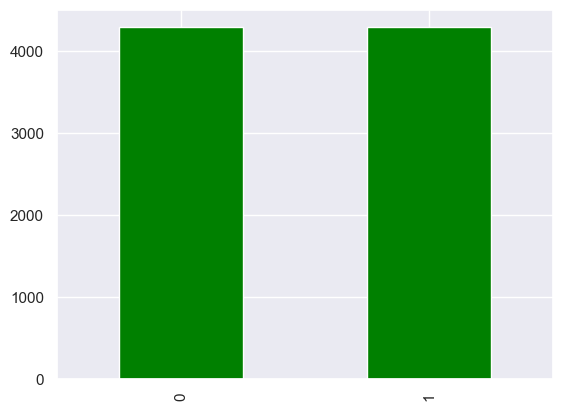

In [81]:
y_train_res.value_counts().plot.bar(color='Green')

In [82]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x_train_res,y_train_res, test_size=0.2)

In [83]:
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import BernoulliNB
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

g=GaussianNB()
b=BernoulliNB()
KN=KNeighborsClassifier()
SVC=SVC() 
D=DecisionTreeClassifier()
R=RandomForestClassifier()
Log=LogisticRegression()
XGB=XGBClassifier()

In [84]:
algos=[g,b,KN,SVC,D,R,Log,XGB]

In [85]:
algorithms_names=['GaussianNB','BernoulliNB','KNeighborsClassifier','SVC','DecisionTreeClassifier','RandomForestClassifier','LogisticRegression','XGBClassifier']

In [86]:
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score
from sklearn.metrics import confusion_matrix,classification_report

accuracy_scored=[]
precision_scored=[]
recall_scored=[]
f1_scored=[]
for item in algos:
  item.fit(x_train,y_train)
  item.predict(x_test)
  accuracy_scored.append(accuracy_score(y_test,item.predict(x_test)))
  precision_scored.append(precision_score(y_test,item.predict(x_test)))
  recall_scored.append(recall_score(y_test,item.predict(x_test)))
  f1_scored.append(f1_score(y_test,item.predict(x_test)))

In [87]:
# create dataframe with results
result=pd.DataFrame(columns=['f1_score','recall_score','precision_score','accuracy_score'],index=algorithms_names)
result['f1_score']=f1_scored
result['recall_score']=recall_scored
result['precision_score']=precision_scored
result['accuracy_score']=accuracy_scored
result.sort_values('accuracy_score',ascending=False)

,f1_score,recall_score,precision_score,accuracy_score
XGBClassifier,0.970588,0.962660,0.978648,0.970896
RandomForestClassifier,0.964623,0.954492,0.974970,0.965076
DecisionTreeClassifier,0.929642,0.940490,0.919042,0.928987
KNeighborsClassifier,0.844242,0.970828,0.746858,0.821304
GaussianNB,0.748874,0.775963,0.723613,0.740396
SVC,0.608498,0.467911,0.869848,0.699651
LogisticRegression,0.690517,0.709452,0.672566,0.682771
BernoulliNB,0.680000,0.813302,0.584241,0.618161


In [88]:
from xgboost import XGBClassifier
XGB = XGBClassifier()
XGB.fit(x_train, y_train) 

print(f"XGB test accuracy: {XGB.score(x_test, y_test):.3f}")

XGB test accuracy: 0.971


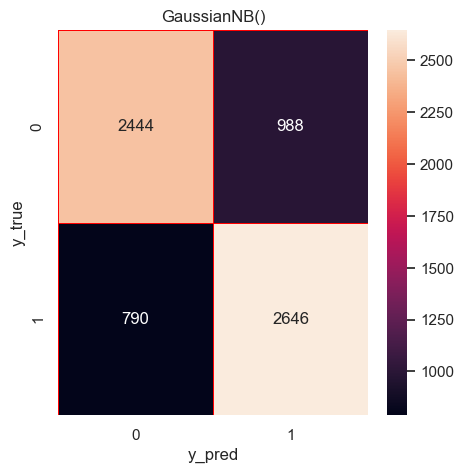

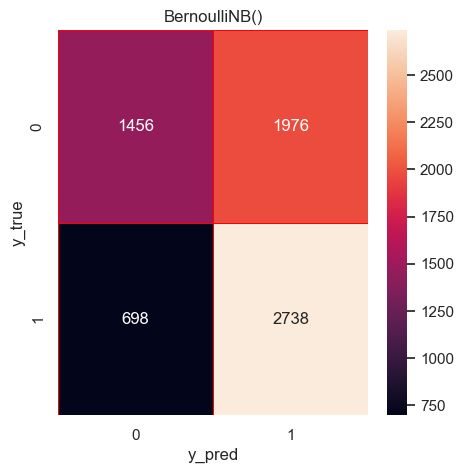

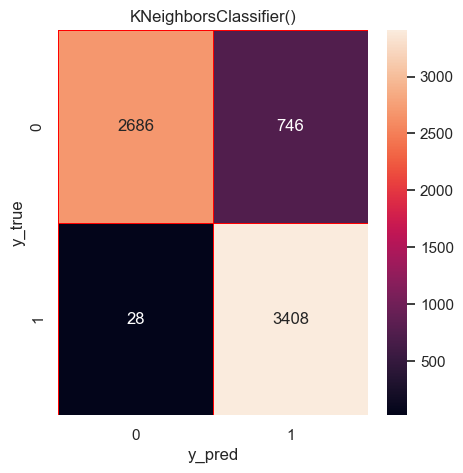

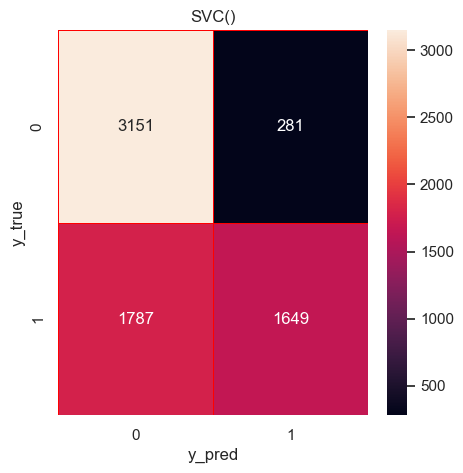

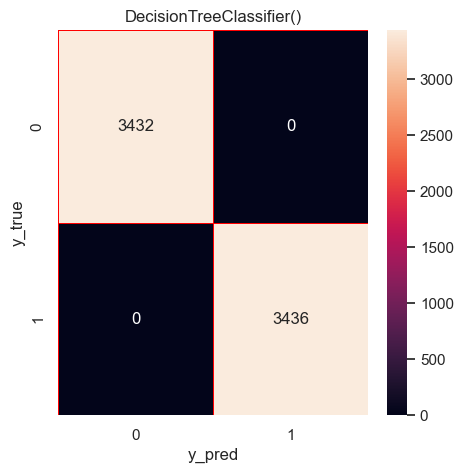

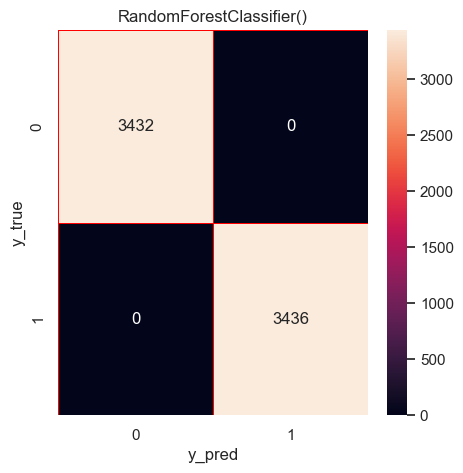

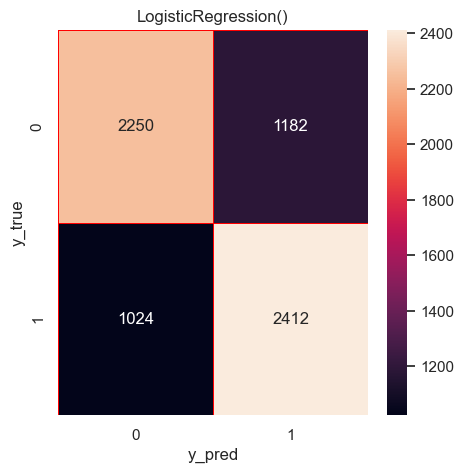

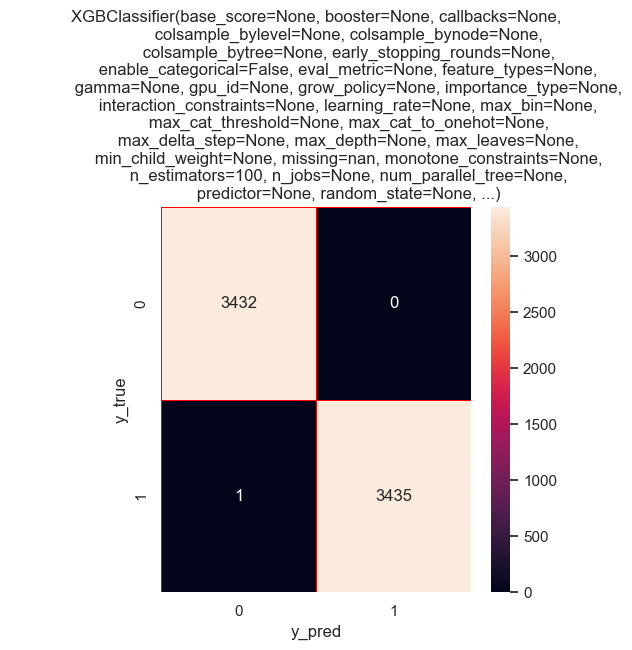

In [89]:
for item in algos:
  item.fit(x_train,y_train)
  item.predict(x_train)
  cm = confusion_matrix(y_train,item.predict(x_train))
  f, ax=plt.subplots(figsize=(5,5))
  sns.heatmap(cm,annot=True,linewidths=0.5,linecolor="red",fmt=".0f",ax=ax)
  plt.xlabel("y_pred")
  plt.ylabel("y_true")
  plt.title(item)
  plt.show()

In [90]:
from sklearn.model_selection import GridSearchCV
parameters = {'max_depth'    : [6,10],
             'criterion'     : ['gini', 'entropy'],
             'max_features'  : ['auto', 'sqrt', 'log2'],
             'n_estimators'  : [50,100]}

grid = GridSearchCV(estimator=R, param_grid = parameters, cv = 2, 
                    verbose = 1, n_jobs = -1, refit = True)
grid.fit(x_train, y_train)

Fitting 2 folds for each of 24 candidates, totalling 48 fits


GridSearchCV(cv=2, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'], 'max_depth': [6, 10],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [50, 100]},
             verbose=1)

In [91]:
grid.best_estimator_

RandomForestClassifier(max_depth=10, max_features='log2')

In [92]:
grid.best_score_

0.9248689574839837

In [93]:
from xgboost import XGBClassifier
Classifier = XGBClassifier()
Classifier.fit(x_train, y_train) 

print(f"Classifier test accuracy: {Classifier.score(x_test, y_test):.3f}")

Classifier test accuracy: 0.971


In [94]:
import pickle

In [95]:
pickle_out=open('Classifier.pkl','wb')

In [96]:
pickle.dump(Classifier,pickle_out)

In [97]:
pickle_out.close()